# Hudson & Thames application

## Intro

### Libraries

In [1]:
#essentials
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [12]:
#settings
%matplotlib inline
plt.style.use('fivethirtyeight')

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = "sans serif"
jet = '#333333'
mpl.rcParams['text.color'] = jet
mpl.rcParams['axes.labelcolor'] = jet
mpl.rcParams['xtick.color']=jet
mpl.rcParams['ytick.color']=jet
mpl.rc('ytick', labelsize=11)
mpl.rc('xtick', labelsize=11)

In [952]:
#finance
import yfinance as yf
from random import gauss, randint, choice, random
from statsmodels import robust

In [974]:
#random forest
from fastai.tabular.all import *
from fastbook import *
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import classification_report, precision_score, recall_score

from rfpimp import *

In [976]:
#some useful functions
def plot_fi(fi): 
    return fi.plot('cols', 'imp', 'barh', figsize=(12,9), legend=False, alpha=0.8)
def rf_feat_importance(m, df):
    return pd.DataFrame({'cols':df.columns, 'imp':m.feature_importances_}
                       ).sort_values('imp', ascending=True)
def rmse(x,y): return math.sqrt(((x-y)**2).mean())
def print_score(m, X_train, y_train, X_valid, y_valid):
    res = [rmse(m.predict(X_train), y_train),
           rmse(m.predict(X_valid), y_valid),
           m.score(X_train, y_train), m.score(X_valid, y_valid)]
    if hasattr(m, 'oob_score_'): res.append(m.oob_score_)
    print(res)

### Framework

Let's start defining some basic portfolio returns functions.

We begin with the \textit{autocorrelation function} which covers a wide variety of examples by itself. 
\begin{definition}
We say a returns distribution {$r_t$} follows a AR(1) distribution if:

$$
r_t=\mu+\rho(r_{t-1}-\mu)+ \epsilon_{t},   
$$
with $\epsilon_t\sim\text{White Noise}(0, \sigma_{\epsilon}^2)$.

\end{definition}
We thus expect the user to specify, in this order, the \textbf{mean expected return} ($\mu$), the \textbf{autocorrelation coefficient} ($\rho$), in the (-1,1) interval to ensure stationarity of the process, the \textbf{standard deviation of the white noise} ($\sigma_{\epsilon}$), and finally the \textbf{lenght of the time window} into consideration.

In [3]:
def AR_1(mu, rho, noise_sigma, time_window):
    if (abs(rho)>=1): 
        return print("Please choose a coefficient in the (-1,1) interval.") #to make sure of stationarity
    else:
        r = []
        r.append(0) #not necessary but, for internal coherence, let's assume that return at time=0 is 0.
        for t in range(1, time_window):
            r.append(mu+rho*(r[t-1]-mu)+gauss(0, noise_sigma))
    return r

The \textit{AR_1} function just defined gives us back a returns distribution. As we mentioned, this alone represents a rich class of examples. In fact, note how changing the autocorrelation coefficient we get into three different scenarios:
- \textit{Random Walk Hypothesis} ( $\rho=0$ ) 
- \textit{mean reversion} ( $\rho\in(-1,0)$ )
- \textit{momentum} ( $\rho\in(0,1)$ )

Next we define the function for the \textit{regime-switching process}.
\begin{definition}
We say a returns distribution {$r_t$} follows a regime-switching process between {$r_{1t}$} and {$r_{2t}$} if:

$$
r_t=I_t r_{1t}+(1-I_{t})r_{2t},
$$

where $r_{it}\sim\mathcal{N}(\mu_i, \sigma_i^2)$, and $I_t$ is an indicator function that takes on the value 1 when state 1 prevails and 0 when state 2 prevails. 
\end{definition}

Hence the user must specify, in this order, the \textbf{mean and standard deviation} of the first normal distribution $( \mu_1, \sigma_1)$, the \textbf{mean and standard deviation} of the second normal distribution $( \mu_2, \sigma_2)$, and, if we denote $p_{ij}$ the probabilities of switching from state $i\in\{1,2\}$ to state $j\in\{1,2\}$, specify also \textbf{the probabilities} $p_{11}$ and $p_{22}$ in the interval [0,1] format, (which are enough since $p_{ij}=1-p_{ii}$). Finally it's required to signal the \textbf{length of the time window} of choice.

In [4]:
def regime_switching(mu_1, sigma_1, mu_2, sigma_2, p_11, p_22, time_window):
    if ((abs(p_11)>1) or (abs(p_22)>1)):
        return print('Probabilities must lie in the [0,1] interval.') #to make sure they are real probabilities
    else:
        r_1 = [] #first distribution
        r_2 = [] #second distribution
        r = []
        r_1.append(0) #usual convention we use on this notebook
        r_2.append(0) #usual convention we use on this notebook
        r.append(0) #usual convention we use on this notebook
        I = []
        I.append(np.random.binomial(1,0.5)) #initializing first state randomly
        for t in range(1, time_window):
            r_1.append(gauss(mu_1, sigma_1)) #drawing from its gaussian
            r_2.append(gauss(mu_2, sigma_2)) #drawing from its gaussian
            if (I[t-1]==1): 
                I.append(np.random.binomial(1,p_11)) #setting up the indicator at time t with chosen probabilities
            else: 
                I.append(np.random.binomial(1,(1-p_22))) #setting up the indicator at time t with chosen probabilities
            r.append(I[t]*r_1[t]+(1-I[t]*r_2[t])) 
    return r   

As before, the function outputs a returns distribution indexable by time.

Now we write a natural simple function to simulate the actual returns distribution described by holding a certain ticker over a chosen time frame. The user only has to specify the \textbf{ticker} of choice (in a string format, i.e. "myticker"), a \textbf{start date} and an \textbf{end date}. The function will compute the P&L for the day (in percentages) resulting by holding the aforementioned ticker by taking into account its closing prices over the chosen period of time.  

In [1233]:
def long(ticker, start, end):
    data = yf.download(ticker, start=start, end=end) #maybe suboptimal memory-wise but I still prefer writing it this way
    data['PnL'] = (data.Close - data.Close.shift(1))*100/data.Close.shift(1) #compute the daily P&L in percentage
    return list(data.PnL.fillna(0))

Lastly we define a function to deal with returns distributed by the famous Pareto power law, because why not? It may be interesting studying this case and trying to conclude something related to stop-losses strategies under this assumption. The only parameters to choose for the user would be the a scalar ($\alpha$) representing basically the thickness of the tail (the lower the number the thicker the tail), i.e. \textbf{the shape of the distribution}, and the usual \textbf{lenght of the time window}.

In [1121]:
def pareto(alpha, time_window):
    r = []
    r.append(0) #usual convention
    for i in range(1, time_window):
        r.append(float(np.random.pareto(alpha, 1)*choice([1, -1]))) #drawing from symmetric pareto distribution 
    return r

Now that we've covered many different examples of portfolio returns is time to define our simple stop-loss policy.
First, let's denote by $R_t(J)$ the cumulative return of the portfolio over a window of $J$ periods (actually it's a proxy of that since we are not compounding but for the sake of triggering the policy it will be fine),
$$
R_t(J) = \sum_{j=1}^{J}r_{t-j+1}.
$$

In [7]:
def cumulative_return(r, J):
    R = []
    for t in range(len(r)):
        R.append(sum(r[max(t-J+1,0):t])) 
        #here we choose to let the first J-1 terms of the list suboptimal 
        #but still different from zero, hopefully this helps and is not misleading
    return R

\begin{definition}
A simple stop-loss policy $\mathcal{S}(\gamma, \delta, J)$ for a portfolio strategy $P$ with returns $\{r_t\}$ is a dynamic binary asset-allocation rule $\{s_t\}$ between $P$ and a risk-free asset $F$ with return $r_f$, where $s_t$ is the proportion of assets allocated to $P$, and:

\begin{equation}
    s_t=
    \begin{cases}
      0 & \text{if}\ R_{t-1}(J)<-\gamma \text{  and  }s_{t-1}=1  \text{      (exit)}\\
      1 & \text{if}\ r_{t-1}\geq\delta \text{ and } s_{t-1}=0 \text{ (re-enter)}\\
      1 & \text{if}\ R_{t-1}(J)\geq-\gamma \text{ and }s_{t-1}=1 \text{ (stay in)}\\
      0 & \text{if}\ r_{t-1}< \delta\text{ and }s_{t-1}=0 \text{ (stay out)}  
    \end{cases}
  \end{equation}
\end{definition}

It follows that, for our function, the user must indicate, in this order, the \textbf{returns distribution} ($\{r_t\}$) associated with $P$,  the \textbf{loss threshold} ($\gamma$), 
the \textbf{re-entry threshold} ($\delta$), and the \textbf{cumulative-return window} ($J$).

In [8]:
def simple_stop_loss(r, gamma, delta, J):
    if (gamma < 0): return print("Gamma must be greater or equal than 0") #we ensure gamma represents a concrete threshold
    else:    
        R_J = cumulative_return(r, J)
        s = []
        s.append(1) #here we specify we are in the strategy at time 0
        for t in range(1,len(r)):
            if ((R_J[t-1]<-gamma)&(s[t-1]==1)): s.append(0) #exit
            elif ((r[t-1]>=delta)&(s[t-1]==0)): s.append(1) #re-enter
            elif ((R_J[t-1]>=-gamma)&(s[t-1]==1)): s.append(1) #stay in
            elif ((r[t-1]<delta)&(s[t-1]==0)): s.append(0) #stay out
        return s

The output of our function is the policy distribution ($\{s_t\}$), i.e. the list in time of ins and outs of our strategy. 

Denote by $r_{st}$ the return, at time $t$, of portfolio strategy $S$, which is the combination of portfolio strategy $P$ and the stop-loss policy $\mathcal{S}$ (having also specified the risk-free asset $F$):

$$
r_{st} = s_tr_t+(1-s_t)r_f-k|s_t-s_{t-1}|,
$$

where $k\geq0$ is the one-way transaction cost of a stop-loss event.

Note that, in general, $\mathcal{S}$ may not be the simple binary stop-loss, for istance it can be weighted (i.e. $s_t\in[0,1]$ instead of $s_t\in\{0,1\}$) thus producing a rolling effect, and also $r_f$ may not necessarily be a deterministic distribution (i.e. a scalar, constant rate of return), for example if we wish to invest in bonds as a less risky asset $F$ instead of cash. 
Hence we define the next function, where we ask the user to input, in this order, the \textbf{returns distribution} ($\{r_t\}$) associated, with $P$, the \textbf{returns distribution} ($\{r_f\}$) of $F$, the \textbf{policy distribution} ($\{s_t\}$) associated with $\mathcal{S}$, and the \textbf{cost of transaction} ($k$).

In [9]:
def return_of_portfolio_with_stop_loss(r, r_f, s, k):
    if (k<0): return print("Transaction cost cannot be negative")
    else:
        #this time taking advantage of pointwise multiplication of pandas series to avoid loop (not necessary since it's a small loop anyways), 
        #and then converting it back to the list format which I like better (not necessary but is the convention I used)
        r_s = list(pd.Series(s)*pd.Series(r) + 
                   (1-pd.Series(s))*r_f - 
                   k*abs(pd.Series(s)-pd.Series(s).shift(1).fillna(1))) 
        #here we define by convention that at time 0 we don't pay the transaction cost to enter our strategy 
        #(by filling nan value from the shift with 1 instead of 0). We do so only for coherence with the other returns, shouldn't make much difference anyways
    
    return r_s

Finally, we introduce the metrics we need to evaluate our stopp-loss policy.

\begin{definition}
The stopping premium $\Delta_\mu(\mathcal{S})$ of a stop-loss policy $\mathcal{S}$ is the expected return difference between the stop-loss policy strategy $S$, i.e. the strategy adjusted  by $\mathcal{S}$ as in (5), and the simple portfolio strategy $P$:

$$
\Delta_\mu = \mathbb{E}[r_{st}]-\mathbb{E}[r_t]=p_0(r_f-\mathbb{E}[r_t|s_t=0]), 
$$
where 
$$
p_0=\text{Prob}(s_t=0)
$$

and the stopping ratio is the ratio of the stopping premium to the probability of stopping out:

$$
\frac{\Delta_\mu}{p_0}=r_f-\mathbb{E}[r_t|s_t=0].
$$
\end{definition}

In [933]:
def stopping_premium_and_ratio(r_s, r):
    Delta_mu = np.mean(r_s)-np.mean(r)
    p_0 = (1-np.mean(s))
    if (p_0!=0):
        ratio = Delta_mu/p_0
    else: ratio = np.nan
    return Delta_mu, p_0, ratio

We wrote a function that outputs the probability of the stop-loss along with the other two metrics, although not mentioned in its own name, to follow the paper and because the user might find accessing it right away useful as well. Hopefully this does't create confusion. 

\begin{definition}
The variance difference $\Delta_{\sigma^2}$ of a stopping strategy is given by:

$$
\Delta_{\sigma^2}=\text{Var}[r_{st}]-\text{Var}[r_t]  
$$

\end{definition}

In [11]:
def variance_difference(r_s, r):
    Delta_sigma2 = np.var(r_s) - np.var(r)
    return Delta_sigma2

## Empirical analysis

### Known results

In this section we apply our framework to well known situations in order to give an empirical intuition about proven results. We will always assume that the expected return of $P$ is greater or equal than the expected return of $F$, and call their difference the \textit{risk premium} of $P$, in notation: $\pi=\mu-r_f$. 

#### First Proposition

\begin{proposition}
If $\{r_t\}$ satisfies the Random Walk Hypothesis so that:

$$
r_t = \mu+\epsilon_t, \text{ }\epsilon_t \text{ }\sim\text{White Noise}(0, \sigma_\epsilon^2), 
$$

then the stop-loss policy has the following properties:

\begin{itemize}
\item $\Delta_\mu = p_0(r_f-\mu) = -p_0\pi$.
\item $\frac{\Delta_\mu}{p_0} = -\pi$.
\item $\Delta_{\sigma^2}=-p_0\sigma^2+p_0(1-p_0)\pi^2$.
\end{itemize}

\end{proposition}

To observe that Proposition 1.1 (empirically) holds we invite the user to generate, by executing the cell below a few times, returns distribution satisfying the Random Walk Hypothesis, i.e. using our AR_1 function with $\rho=0$, and checking the numbers.

The risk premium of P is: 0.06

The probability of a stop-loss is: 0.26

The stopping premium of this strategy is: -0.01 , which is very similar to: -0.01

The stopping ratio is: 0 , which is very similar to: -0.05

The variance difference is: -0.06 , which is very similar to: -0.06

CPU times: user 50.1 ms, sys: 2.55 ms, total: 52.7 ms
Wall time: 51.1 ms


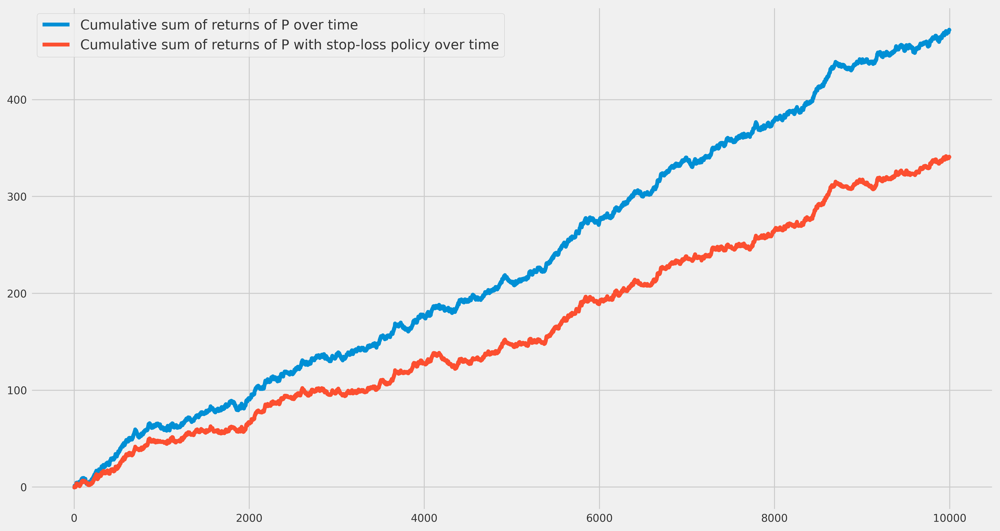

In [899]:
%%time
#set up with random parameters

mu = 1/randint(3,20) #choosing the expected return randomly
rho = 0 #to lie in the hypothesis scenario
noise_sigma = 1/randint(1,10) 
time_window = 10000
r_f = 0 #0 mimic situation of F being cash for simplicity, without losing generality since mu is random 

r = AR_1(mu, rho, noise_sigma, time_window)
print('The risk premium of P is:', round(mu-r_f, 2))

gamma = 1/randint(1, 20) #choosing the threshold randomly 
delta = 1/randint(1, 20) #choosing the threshold randomly 
J = randint(1, 100) #choosing the time window randomly
s = simple_stop_loss(r, gamma, delta, J)

print()
#to avoid a bug 
if (np.mean(s)==1): 
    print('\033[1m' + 'Ops! Sorry, this time no stop-loss occured, please try again!' + '\033[0m')
    print()
else:   
    k = 0 #for the sake of the argument let's assume we are in the best possible world with no trading fees, still, *SPOILER ALERT* it's not gonna be worth it adding the policy
    r_s = return_of_portfolio_with_stop_loss(r, r_f, s, k)

    Delta_mu, p_0, ratio = stopping_premium_and_ratio(r_s, r) #computing metrics
    print('The probability of a stop-loss is:', round(p_0,2))
    print()

    print('The stopping premium of this strategy is:', round(p_0*(r_f-mu),2), #statement of Proposition 1.1
          ', which is very similar to:', round(Delta_mu, 2)) #computed by our function
    print()
    print('The stopping ratio is:',  round(r_f-mu),  #statement of Proposition 1.1
          ', which is very similar to:', round(ratio, 2))  #computed by our function  
    print()
    print('The variance difference is:', round(-p_0*np.square(noise_sigma)+p_0*(1-p_0)*np.square(mu-r_f), 2), #by Proposition 1.1
          ', which is very similar to:', round(variance_difference(r_s, r), 2)) #computed by our function  
    print()
    
    plt.figure(figsize=(16,9)) 
    #decoupling of cumulative returns, keep in mind these are not the actual compound returns
    plt.plot(np.cumsum(r), label='Cumulative sum of returns of P over time')
    plt.plot(np.cumsum(r_s), label='Cumulative sum of returns of P with stop-loss policy over time')
    plt.legend()

Even though sometimes the numbers differ, most importantly we have that:

\begin{remark}
If $\{r_t\}$ satisfies the Random Walk Hypothesis, than the stopping premium is never positive.
\end{remark}

which of course follows by Proposition 1.1 (since $\pi>0$), and we can observe empirically through our framework (i.e. in every run of the cell the blue line ends up being above the red line on the long run).

#### Second Proposition

We continue with the second result we can find in the paper:

\begin{proposition}
If $\{r_t\}$ satisfies an AR(1) (1), then the stop-loss policy (4) has the following properties:

$$
\frac{\Delta_\mu}{p_0}=-\pi+\rho\sigma+\eta(\gamma,\delta,J)
$$

and for $\rho>0$ and reasonable stop-loss parameters, it can be shown that $\eta(\gamma,\delta,J)\geq0$, which yields the following lower bound:

$$
\frac{\Delta_\mu}{p_0}\geq-\pi+\rho\sigma
$$
\end{proposition}

What we are mostly interested in in this presentation is the following consequence of Proposition 1.2:

\begin{remark}

\begin{itemize}
\item For a mean-reverting portfolio strategy, $\rho<0$, the stop-loss policy hurts expected returns to a first-order approximation.
\item On the other hand, for a momentum strategy, $\rho>0$, there is a possibility that the second term dominates the first, yielding a positive stopping premium.
\end{itemize}
\end{remark}

Let's produce some data to study

CPU times: user 163 ms, sys: 3.07 ms, total: 166 ms
Wall time: 165 ms


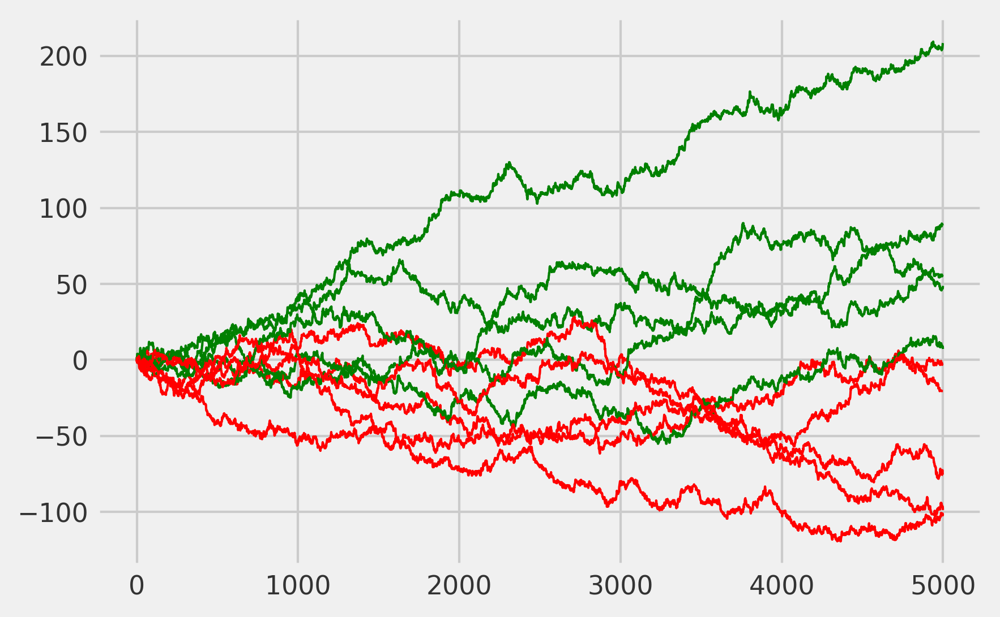

In [913]:
%%time
mu = 1/randint(2,200) #we fix mu with a random choice
noise_sigma = 1/randint(1,10) #fix sigma
time_window=5000
r_f = 0 #it's ok since mu is random to fix r_f to 0 without losing generality

gamma = 1/randint(1, 20) #fix the threshold randomly 
delta = 1/randint(1, 20) #fix the threshold randomly 
J = randint(1, 100) #fix the time window randomly

k = 0 #fix free transaction without losing generality

data = [] #a list of observations

for i in range(10):
    rho = random()*choice([1, -1]) #let vary rho randomly in (-1,1)
    r = AR_1(mu, rho, noise_sigma, time_window)
    s = simple_stop_loss(r, gamma, delta, J)
    r_s = return_of_portfolio_with_stop_loss(r, r_f, s, k)
    Delta_mu, p_0, ratio = stopping_premium_and_ratio(r_s, r) #computing metrics
    data.append([rho, Delta_mu, p_0, ratio])
    #plot to see the decoupling visually
    if (rho>0):
        plt.plot(np.cumsum(r_s), label='momentum', c='g', lw=1) #plotting cumulative returns in momentum scenario
    else: plt.plot(np.cumsum(r_s), label='mean-reverting', c='r', lw=1) #plotting cumulative returns in mean-reverting scenario

We found the following parameters for the stop-loss policy in which we have a sensible improvement in using stop-loss policy in momentum (green lines) vs mean-reverting (red lines):

In [921]:
gamma, delta, J

(0.0625, 0.3333333333333333, 2)

In [929]:
df = pd.DataFrame(data, columns=['rho', 'Delta_mu', 'p_0', 'ratio'])
df.corr().style.background_gradient()

,rho,Delta_mu,p_0,ratio
rho,1.000000,0.937101,0.187121,0.938286
Delta_mu,0.937101,1.000000,0.392174,0.999987
p_0,0.187121,0.392174,1.000000,0.390032
ratio,0.938286,0.999987,0.390032,1.000000


It seems at a first glance that $\rho$ and $\Delta_\mu$ might be correlated. To see it let's collect a lot more data.

In [959]:
%%time
#this time let's randomize everything everytime and record all the parameters on a dataframe we can then study
##keep fixed only the following
time_window=5000 
k = 0 #fix free transaction without losing generality
r_f = 0 #it's ok since mu is random to fix r_f to 0 without losing generality

data = [] #a list of observations
for i in range(30000): #I chose this big number only because I wanted 10k-ish observations with applied stop-loss and by setting everything randomly it looked a 1/3 ratio
    mu = random() 
    noise_sigma = random() 
    rho = random()*choice([1, -1]) #let rho vary randomly in (-1,1)
    r = AR_1(mu, rho, noise_sigma, time_window)   
    gamma = random()
    delta = random() 
    J = randint(1, 300) 
    s = simple_stop_loss(r, gamma, delta, J)
    r_s = return_of_portfolio_with_stop_loss(r, r_f, s, k)
    Delta_mu, p_0, ratio = stopping_premium_and_ratio(r_s, r) #computing metrics
    
    data.append([mu, noise_sigma, rho, gamma, delta, J, Delta_mu, p_0, ratio])

CPU times: user 7min 23s, sys: 847 ms, total: 7min 23s
Wall time: 7min 23s


In [963]:
df = pd.DataFrame(data, columns=['mu', 'sigma', 'rho', 'gamma', 'delta', 'J', 'Delta_mu', 'p_0', 'ratio'])
df

,mu,sigma,rho,gamma,delta,J,Delta_mu,p_0,ratio
0,0.544505,0.159563,0.090044,0.108619,0.744321,150,0.000000,0.0000,NaN
1,0.525667,0.427668,0.210958,0.816247,0.878724,138,0.000000,0.0000,NaN
2,0.352293,0.317958,0.096539,0.537486,0.433735,67,0.000000,0.0000,NaN
3,0.307402,0.937850,-0.978332,0.724694,0.508078,65,-0.000049,0.0004,-0.121298
4,0.137552,0.829089,0.803901,0.737578,0.778981,129,0.043867,0.2504,0.175189
...,...,...,...,...,...,...,...,...,...
29995,0.312311,0.752172,0.068633,0.943128,0.400630,45,0.000000,0.0000,NaN
29996,0.554587,0.938233,-0.527291,0.204372,0.973418,283,0.000000,0.0000,NaN
29997,0.970154,0.256202,-0.777337,0.857908,0.101836,133,0.000000,0.0000,NaN
29998,0.913455,0.228641,0.003167,0.217350,0.734561,208,0.000000,0.0000,NaN


First, let's assume that Proposition 1.2 holds and let's add the column eta to the dataframe:

In [1016]:
df['eta'] = df.ratio+df.mu-(df.rho*df.sigma)

We are interested in the region of the three dimensional space ($\gamma, \delta, J$), where $\eta(\gamma, \delta, J)\geq0$ when $\rho>0$.

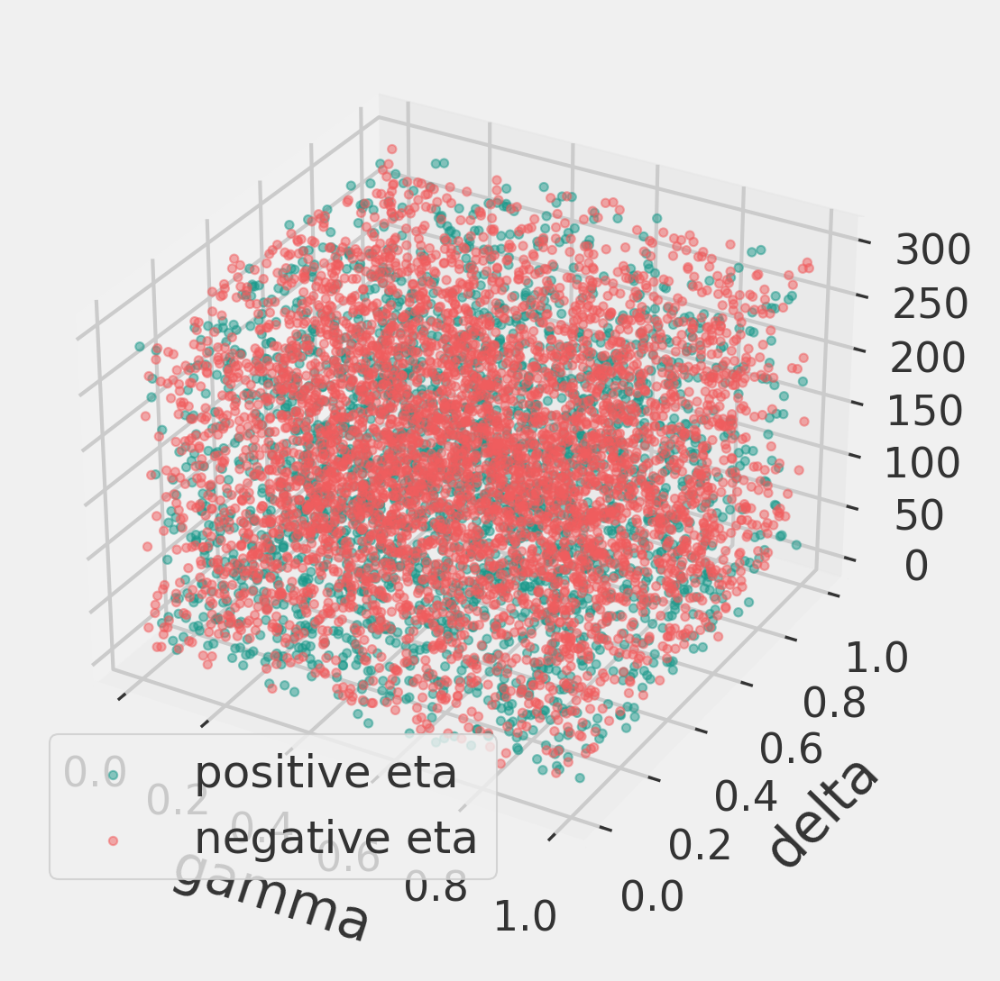

Eta is positive in 2513  cases, while negative in 4526  cases.


In [1043]:
from mpl_toolkits import mplot3d #library for 3d plots

cond1 = ((df.rho>0) & (df.eta>=0))
cond2 = ((df.rho>0) & (df.eta<0))

fig = plt.figure()
ax = plt.axes(projection ='3d')
ax.scatter(df.loc[cond1].gamma, df.loc[cond1].delta, df.loc[cond1].J, s=5, alpha=0.5, 
           c='#1B998B', label='positive eta') #positive eta
ax.scatter(df.loc[cond2].gamma, df.loc[cond2].delta, df.loc[cond2].J, s=5, alpha=0.5, 
           c='#F05D5E', label='negative eta') #negative eta
plt.xlabel('gamma')
plt.ylabel('delta')
plt.legend()
plt.show()
print('Eta is positive in', cond1.sum(), ' cases, while negative in', cond2.sum(), ' cases.')

Unfortunately enough this picture isn't clear at all to say the least, so in order to trying to understand the region we plot three 2d scatterplots:

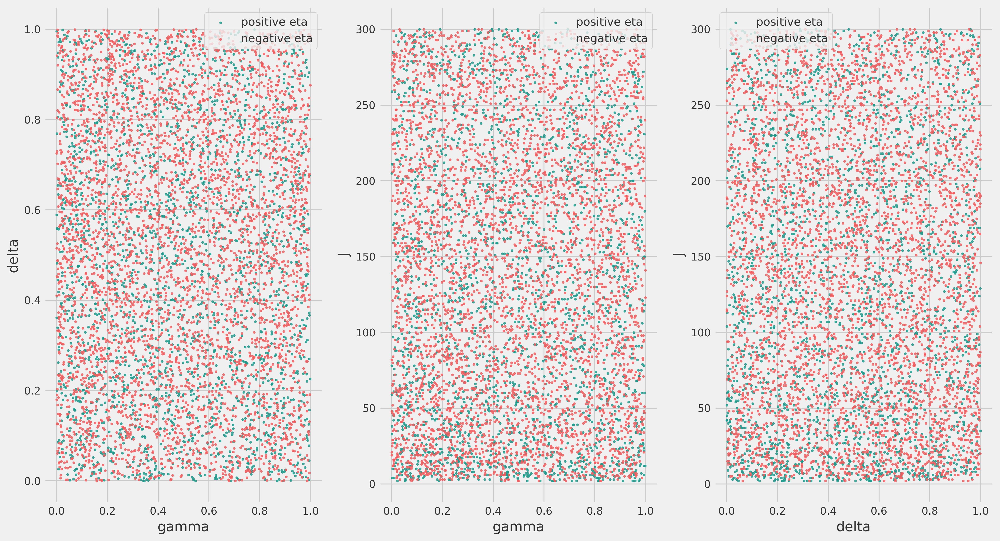

In [1046]:
plt.figure(figsize=(16,9))
#first subplot
plt.subplot(131)
plt.scatter(df.loc[cond1].gamma, df.loc[cond1].delta, s=5, alpha=0.8, 
           c='#1B998B', label='positive eta') #positive eta)
plt.scatter(df.loc[cond2].gamma, df.loc[cond2].delta, s=5, alpha=0.8, 
           c='#F05D5E', label='negative eta') #negative eta
plt.xlabel('gamma')
plt.ylabel('delta')
plt.legend()

#second subplot
plt.subplot(132)
plt.scatter(df.loc[cond1].gamma, df.loc[cond1].J, s=5, alpha=0.8, 
           c='#1B998B', label='positive eta') #positive eta)
plt.scatter(df.loc[cond2].gamma, df.loc[cond2].J, s=5, alpha=0.8, 
           c='#F05D5E', label='negative eta') #negative eta
plt.xlabel('gamma')
plt.ylabel('J')
plt.legend()

#third subplot
plt.subplot(133)
plt.scatter(df.loc[cond1].delta, df.loc[cond1].J, s=5, alpha=0.8, 
           c='#1B998B', label='positive eta') #positive eta)
plt.scatter(df.loc[cond2].delta, df.loc[cond2].J, s=5, alpha=0.8, 
           c='#F05D5E', label='negative eta') #negative eta
plt.xlabel('delta')
plt.ylabel('J')
plt.legend()
plt.show()

This doesn't look like helping either... So our last chance is to try modeling $\eta$.

In [1050]:
%%time
dep_var = 'eta'
parameters = ['gamma', 'delta', 'J']

cond = ((df.eta.notnull())&(df.rho>0))

#We study the cases we are interested in
splits = RandomSplitter(valid_pct=0.2)(range_of(df.loc[cond]))

#it's not necessary to pre-process the data using the fastai library but I'm used to doing it so I'll do it here as well
#one can ignore the next pre-processing redudant lines they don't matter
cont, cat = cont_cat_split(df[parameters+[dep_var]], 1, dep_var=dep_var)

procs = [Categorify, FillMissing]
to = TabularPandas(df.loc[cond][parameters+[dep_var]], 
                   procs=procs, 
                   cont_names=cont, 
                   cat_names=cat, 
                   splits=splits, 
                   y_names=dep_var)

xt = to.train.xs
yt = to.train.y
xv = to.valid.xs
yv = to.valid.y

CPU times: user 33.5 ms, sys: 2.21 ms, total: 35.7 ms
Wall time: 34.4 ms


In [1053]:
%%time
m = RandomForestRegressor(n_jobs=-1, 
                          n_estimators=320,
                          min_samples_leaf=5, 
                          max_depth=50, 
                          max_features='sqrt',
                          oob_score=True)
m.fit(xt,yt)
print_score(m, xt, yt, xv, yv) #first two numbers will be mean errors respectively in training and validation set, 
                               #last three numbers will be, in this order: 
                               #r^2 on the training set, r^2 on the validation set, out of the bag score

[0.7441916832082113, 1.078746344935515, 0.2896441299054344, -0.007097347015873945, -0.012228502944809483]
CPU times: user 2.46 s, sys: 330 ms, total: 2.79 s
Wall time: 791 ms


\begin{problem}
Ehm, apparently I got things wrong because this doesn't look like a relation to me, maybe $\eta$ is not a function of the parameters? Or maybe is too complicated for a forest and I should try the neural net approach? I know only I didn't get it right and I don't have much time, so I'll leave this topic for now, sorry to let you down.
\end{problem}

-------------------------

Let's start over with a real exercise and try to simple modeling $\Delta_\mu$ in function of the parameters (both of $P$ and $\mathcal{S}$) using a forest which is easy to interpretate.

In [1098]:
%%time
dep_var = 'Delta_mu'
parameters = ['mu', 'sigma', 'rho', 'gamma', 'delta', 'J']

#We study the cases in which we had an actual stop-loss policy i.e. ratio != 0
splits = RandomSplitter(valid_pct=0.3)(range_of(df.loc[df.ratio.notnull()]))

#it's not necessary to pre-process the data using the fastai library but I'm used to doing it so I'll do it here as well
#one can ignore the next pre-processing redudant lines they don't matter
cont, cat = cont_cat_split(df[parameters+[dep_var]], 1, dep_var=dep_var)

procs = [Categorify, FillMissing]
to = TabularPandas(df.loc[df.ratio.notnull()][parameters+[dep_var]], 
                   procs=procs, 
                   cont_names=cont, 
                   cat_names=cat, 
                   splits=splits, 
                   y_names=dep_var)

xt = to.train.xs
yt = to.train.y
xv = to.valid.xs
yv = to.valid.y

CPU times: user 45.4 ms, sys: 5.07 ms, total: 50.5 ms
Wall time: 48.7 ms


In [1099]:
%%time
m = RandomForestRegressor(n_jobs=-1, 
                          n_estimators=320,
                          min_samples_leaf=10, 
                          max_depth=20, 
                          max_features='sqrt',
                          oob_score=True)
m.fit(xt,yt)
print_score(m, xt, yt, xv, yv)

[0.27638680296431617, 0.4101990818258295, 0.5492453557485439, 0.35410300474862944, 0.4499800883463765]
CPU times: user 4.54 s, sys: 232 ms, total: 4.77 s
Wall time: 896 ms


This model has a $r^2$ of 0.55 on the training set, 0.35 on the validation set and 0.45 out of the bag score. These numbers are certainly not great but they suggest that under certain conditions maybe one can guess the value of $\Delta_\mu$ by knowing the parameters.

<Figure size 1800x1200 with 0 Axes>

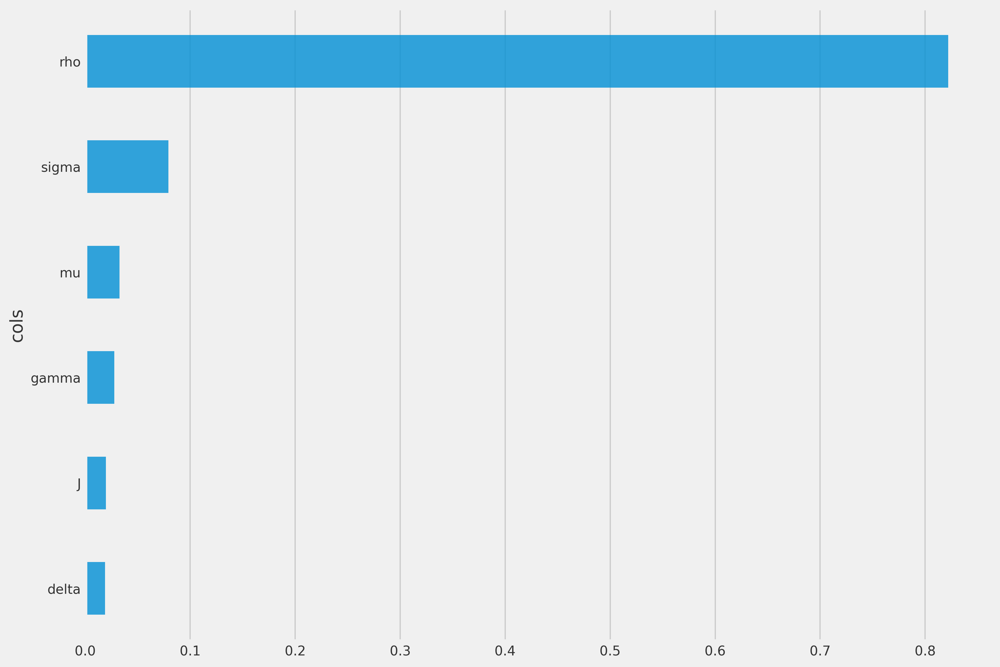

In [1102]:
fi = rf_feat_importance(m, xt)
fig = plt.figure() 
ax2 = plot_fi(fi[-30:])
ax2.grid(axis='y')
plt.show()

Perfect! Exactly what we wanted almost all the variance of our predictions of $\Delta_\mu$ seems to be explained by $\rho$, by far the most important feature for the model.

CPU times: user 46.6 ms, sys: 1.87 ms, total: 48.5 ms
Wall time: 46.8 ms


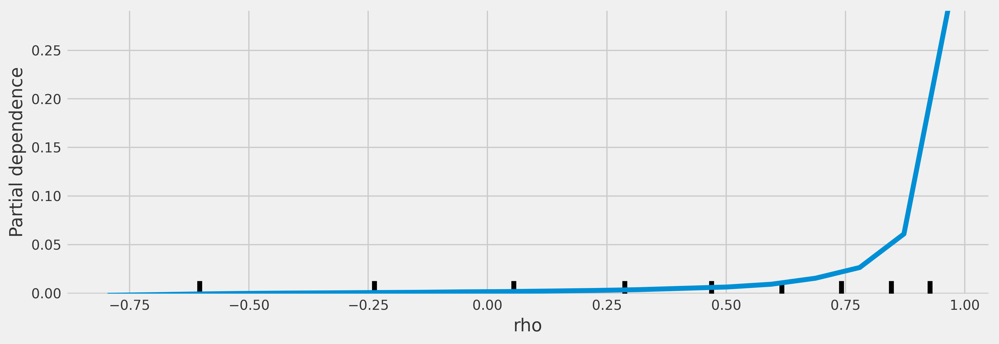

In [1101]:
%%time
from sklearn.inspection import plot_partial_dependence

fig,ax = plt.subplots(figsize=(12, 4))
plot_partial_dependence(m, xt, ['rho'], grid_resolution=20, ax=ax);

The partial dependance shows clearly that, all the rest being equal, strong changes towards positive $\rho$ are influencing our $\Delta_\mu$.

Since also $\sigma$ looks interesting we show the dependance over it as well, for completeness:

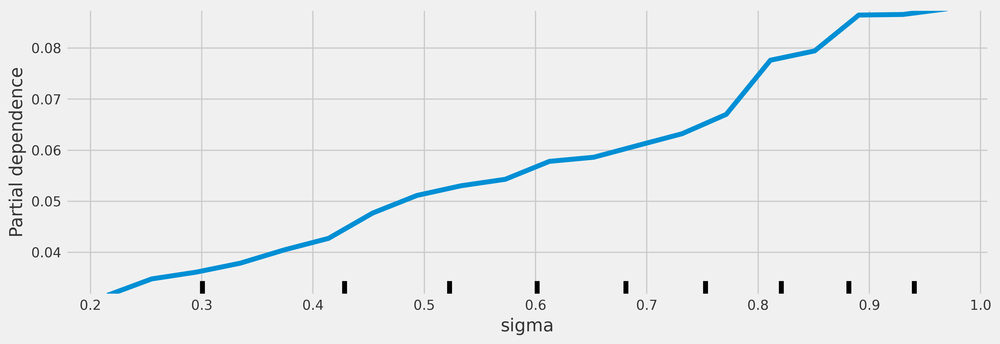

In [1100]:
fig,ax = plt.subplots(figsize=(12, 4))
plot_partial_dependence(m, xt, ['sigma'], grid_resolution=20, ax=ax);

It's a nice direct correlation, suggesting the more the variance on the returns the more having a stop-loss can benefit our premium $\Delta_\mu$ (in momentum AR(1), as previously discussed).

In [1054]:
import warnings
warnings.simplefilter('ignore', FutureWarning)

from treeinterpreter import treeinterpreter
from waterfall_chart import plot as waterfall

Let's also have a look at the lowest and highest $\Delta_\mu$ and what parameters mattered the most in their predictions.

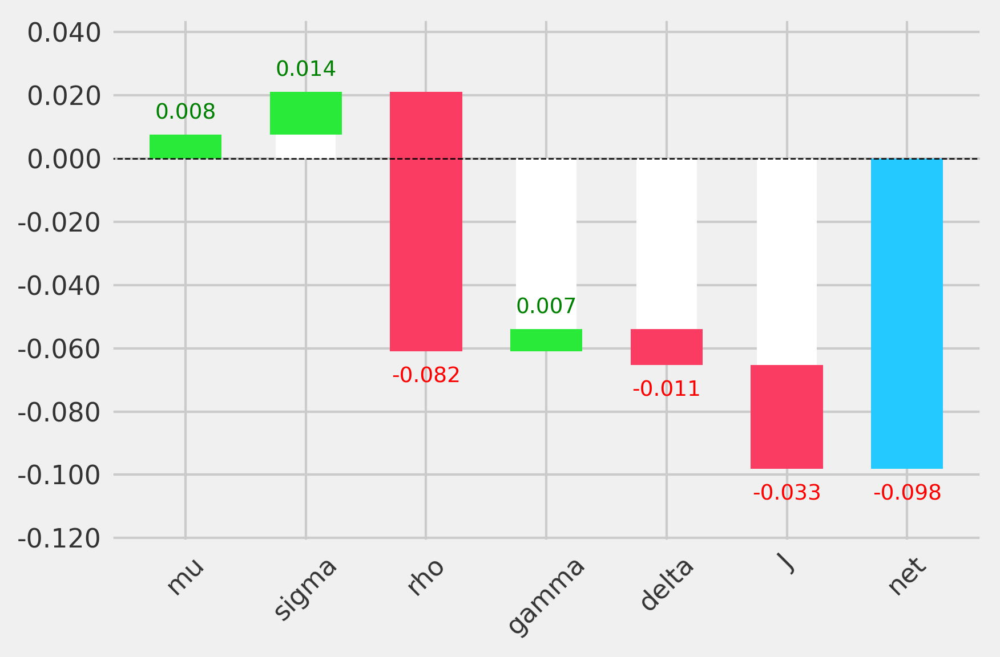

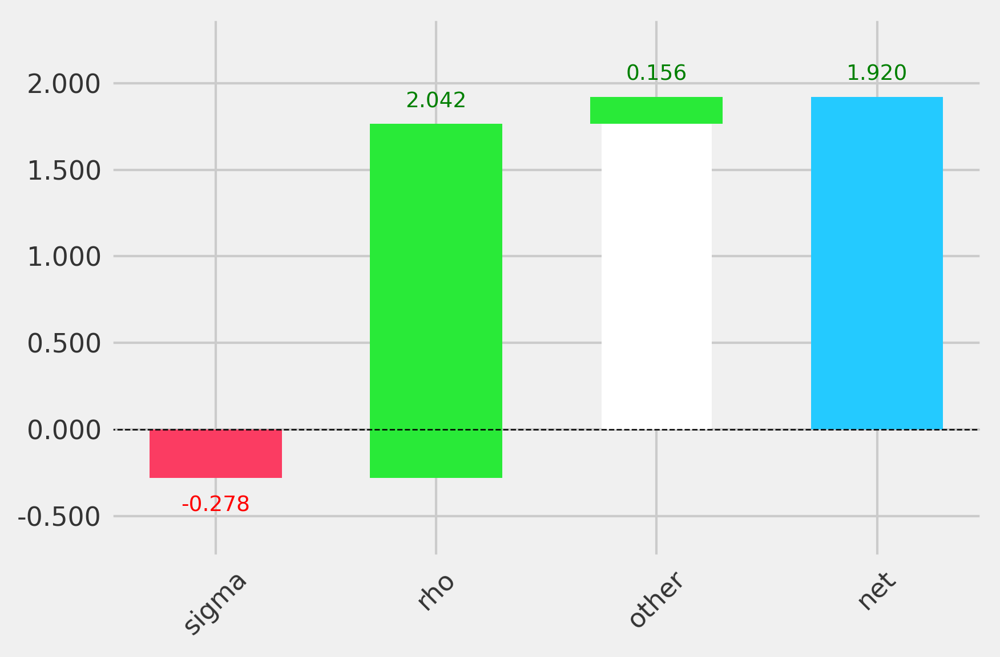

In [1106]:
row = []
row.append(yv.argmin()) #the index of the lowest value of Delta_mu in the validation set
row.append(yv.argmax()) #the index of the highest value of Delta_mu in the validation set

prediction,bias,contributions = treeinterpreter.predict(m, xv.iloc[row].values) #build the waterfall chart
for i in range(len(row)):
    waterfall(xv.columns, contributions[i], threshold=0.08, 
          rotation_value=45,formatting='{:,.3f}');

In [1303]:
xv.iloc[row]

,mu,sigma,rho,gamma,delta,J
19343,0.819711,0.939021,-0.995570,0.464574,0.883146,2
25747,0.106108,0.276819,0.999828,0.944560,0.646885,175


These waterfall charts reinforce the intuition that $\rho<0$ leads to worse $\Delta_\mu$, but of course are not enough to conclude it for good. Let's finally plot the chart we all were waiting for, the one with these two parameters together.

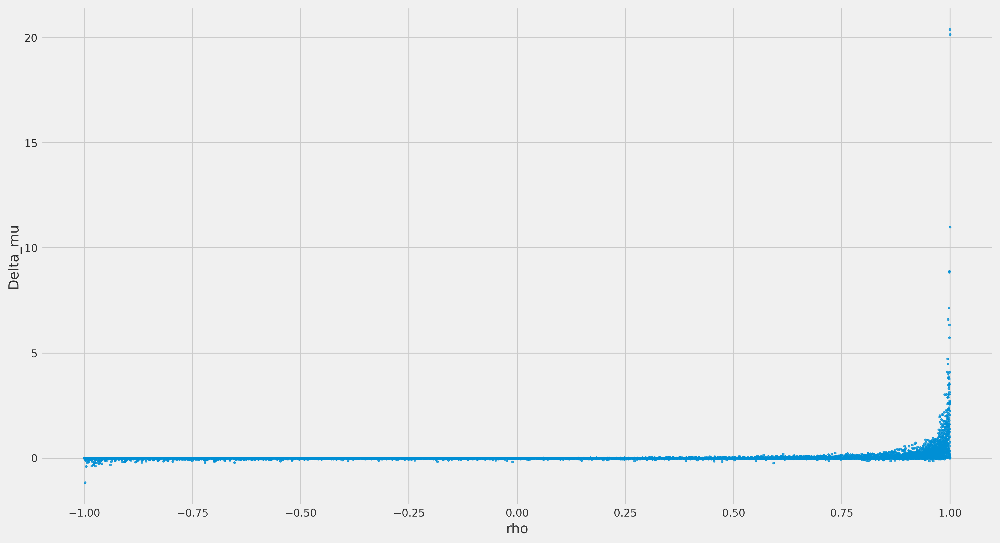

In [1108]:
plt.figure(figsize=(16,9))
plt.scatter(df.loc[df.ratio.notnull()].rho, df.loc[df.ratio.notnull()].Delta_mu, s=5, alpha=0.8) 
plt.xlabel('rho')
plt.ylabel('Delta_mu')
plt.show()

Let's filter out outliers on $\Delta_\mu$ and try again (it would have been a better idea to filter them out before trying to model with the regressor actually, but I forgot it, hope this doesn't matter too much, I know it's a good practice):

[array([-0.00347937, -0.01787305]), array([0.00611923, 0.02048434])]

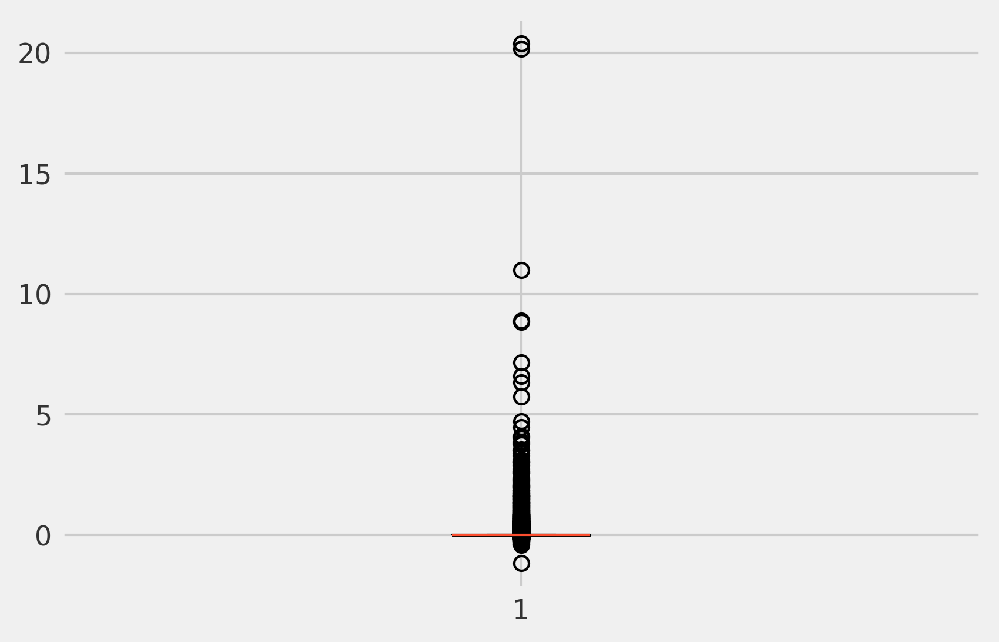

In [1109]:
B = plt.boxplot(df.loc[df.ratio.notnull()].Delta_mu)
[item.get_ydata() for item in B['whiskers']]

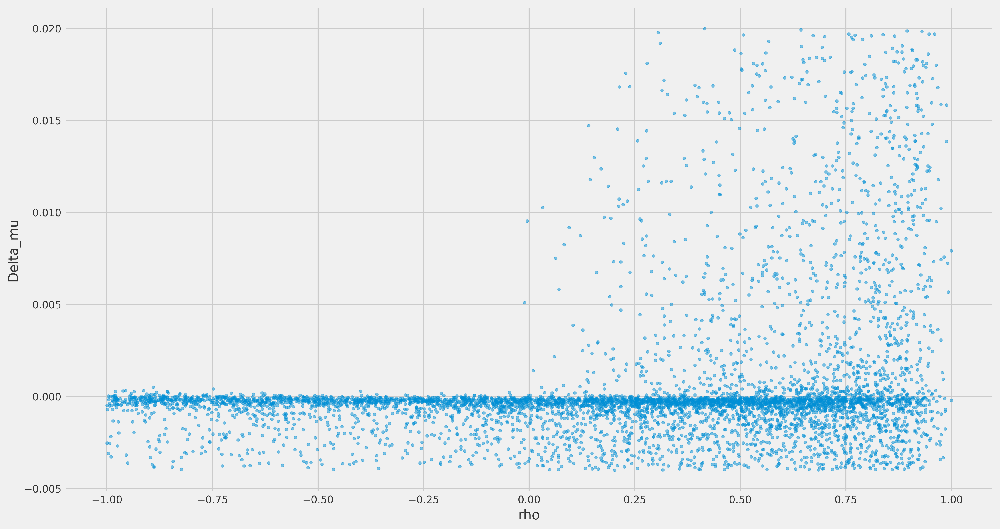

In [1113]:
#here we filter using the whiskers heights we found in the previous cell
cond = ((df.Delta_mu>=-0.004) & (df.Delta_mu<=0.02) & (df.ratio.notnull())) 

plt.figure(figsize=(16,9))
plt.scatter(df.loc[cond].rho, df.loc[cond].Delta_mu, s=10, alpha=0.5) 
plt.xlabel('rho')
plt.ylabel('Delta_mu')
plt.show()

Perfect! While on the right hand side we have a lot more variance (possibly correlated, among the others, with the actual variance of returns as we mentioned before) and we can have positive premiums under certain conditions, on the left hand side, where $\rho<0$ we basically only have negative premiums $\Delta_\mu$ as expected (see Remark 1.2).

#### Third Proposition

We now get into the third and final proposition of the paper:

\begin{proposition}
If $\{r_t\}$ satisfies the two-state Markov regime-switching process (2), then the stop-loss policy (4) has the following properties:

\begin{itemize}
\item $\Delta_\mu=p_{0,1}(r_f-\mu_1)+p_{0,2}(r_f-\mu_2)$
\item $\frac{\Delta_\mu}{p_0} = (1-\tilde{p}_{0,2})(r_f-\mu_1)+(\tilde{p}_{0,2})(r_f-\mu_2)$
\end{itemize}

where:

\begin{itemize}
\item $p_{0,1}=\text{Prob}(s_t=0, I_t=1)$
\item $p_{0,2}=\text{Prob}(s_t=0, I_t=0)$
\item $\tilde{p}_{0,2}=\frac{p_{0,2}}{p_0}=\text{Prob}(I_t=0|s_t=0)$
\end{itemize}
\end{proposition}

\begin{problem}
I leave this for now, maybe I come back at it later if I have time. It would be a very similar, yet more complicated, analysis as in the last chapter.
\end{problem}

### Simple stop-loss policy paired with SPY returns distribution, an unpretentious analysis 

We begin by downloading the data we'll need and generating the returns distributions.

In [1478]:
start="1993-01-01"
end="2021-05-28"
ticker="SPY"

r = long(ticker, start, end) #daily P&L in percentages by holding the market for 30 years 

[*********************100%***********************]  1 of 1 completed


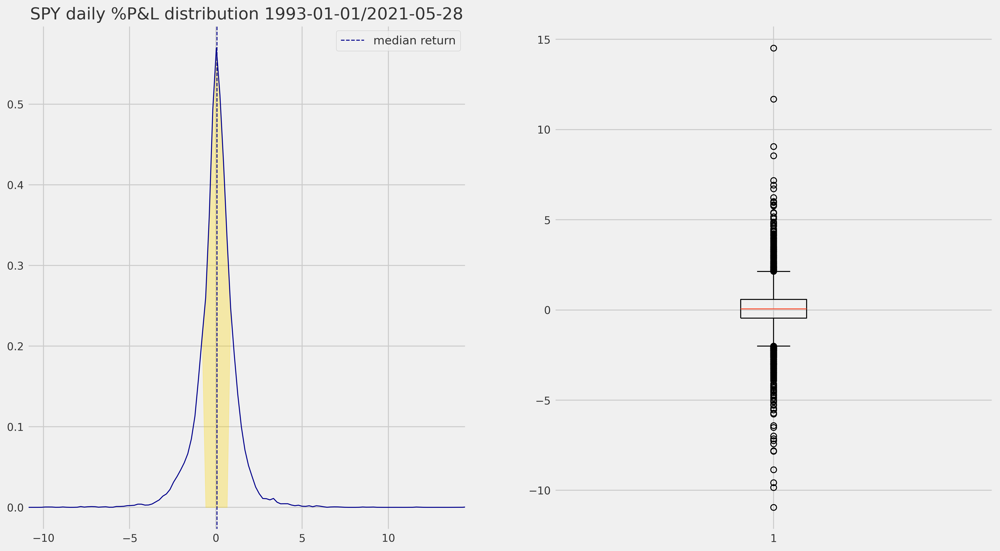

In [1504]:
plt.figure(figsize=(16,9))
plt.subplot(121)

ax = sns.distplot(pd.Series(r), hist=False, kde=True,
             bins='fd', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'shade': False, 'linewidth': 1, 'color':'darkblue'})

#I choose to plot this region instead of the standard mean+-standard deviation because there are too many outliers
x0=np.median(r)-robust.mad(r) 
x1=np.median(r)+robust.mad(r)
kde_x, kde_y = ax.lines[0].get_data()
ax.fill_between(kde_x, kde_y, where=(kde_x > x0) & (kde_x < x1), 
                interpolate=True, color='gold', alpha=0.3)

plt.axvline(pd.Series(r).median(), color='darkblue', linewidth=1, label='median return', ls='--')

plt.xlim((pd.Series(r).min(), pd.Series(r).max()))
plt.title('SPY daily %P&L distribution '+start+'/'+end)
plt.legend()
plt.subplot(122)
plt.boxplot(pd.Series(r))
plt.show()

Looks like a symmetric Pareto distribution, with median and median absolute deviation of:

In [1481]:
np.median(r), robust.mad(r)

(0.06320103971252873, 0.7674890243868778)

Now we quickly try to run the framework functions to get a glimpse on how a few simple stop-loss policies would have actually performed.

In [1500]:
%%time 

mu = np.mean(r) 
sigma = np.std(r)

#these should be the numbers I've found in the paper if I got them correctly
gammas = [mu+0.5*sigma, mu+0.8*sigma, mu+sigma, mu+1.2*sigma, mu+1.5*sigma] 
delta = mu
Js = [3, 5, 10, 20, 60, 120] 

r_f = 0 #still cash as a risk-free option
k = 0 #still free commission

observations = []

for J in Js:
    for gamma in gammas:
        s = simple_stop_loss(r, gamma, delta, J) #compute the policies
        r_s = return_of_portfolio_with_stop_loss(r, r_f, s, k) #compute the adjusted returns 
        #compute metrics for the strategy
        Delta_mu, p_0, ratio = stopping_premium_and_ratio(r_s, r)
        Delta_sigma = variance_difference(r_s, r)
        #collect the data
        observations.append([gamma, delta, J, Delta_mu, p_0, ratio, Delta_sigma])
        
obs = pd.DataFrame(observations, columns=['gamma', 'delta', 'J', 'Delta_mu', 'p_0', 'ratio', 'Delta_sigma'])
obs

CPU times: user 1.31 s, sys: 4.92 ms, total: 1.32 s
Wall time: 1.32 s


,gamma,delta,J,Delta_mu,p_0,ratio,Delta_sigma
0,0.633013,0.038697,3,-0.017004,0.226521,-0.075068,-0.571626
1,0.989603,0.038697,3,-0.015689,0.168629,-0.093038,-0.516524
2,1.227329,0.038697,3,-0.012802,0.145360,-0.088070,-0.492003
3,1.465056,0.038697,3,-0.015348,0.123633,-0.124143,-0.456078
4,1.821646,0.038697,3,-0.017922,0.091534,-0.195796,-0.404527
5,0.633013,0.038697,5,-0.026618,0.236053,-0.112761,-0.563546
6,0.989603,0.038697,5,-0.016888,0.192318,-0.087813,-0.546202
7,1.227329,0.038697,5,-0.016564,0.166667,-0.099386,-0.520444
8,1.465056,0.038697,5,-0.020506,0.141716,-0.144700,-0.490257
9,1.821646,0.038697,5,-0.017230,0.121391,-0.141938,-0.458359


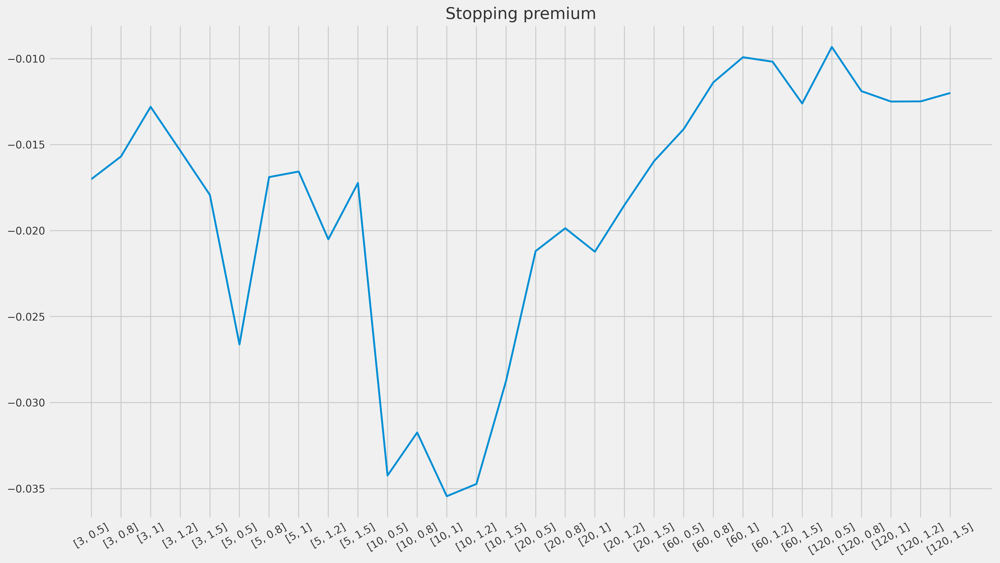

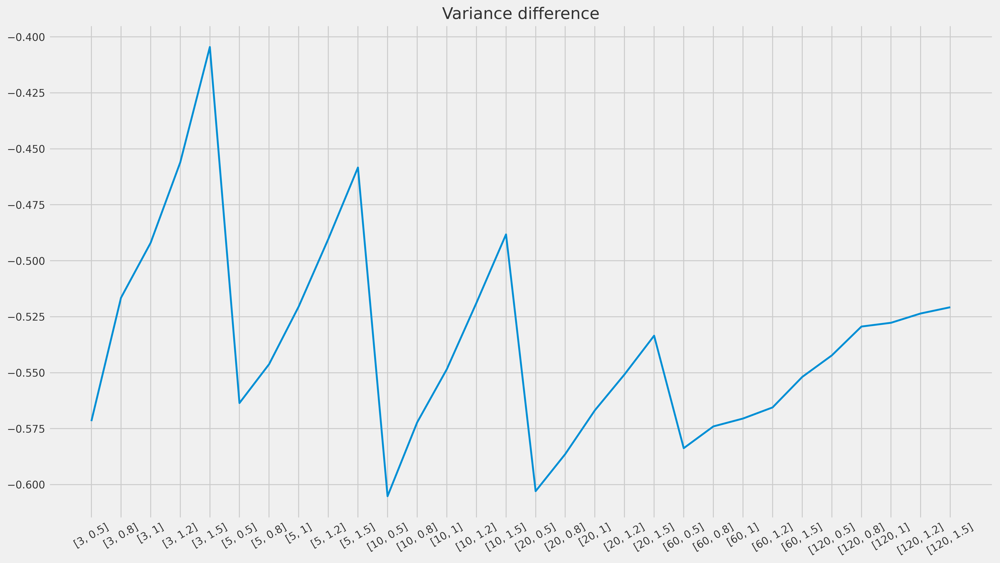

In [1529]:
lbls = []
for J in Js:
    for i in [0.5, 0.8, 1, 1.2, 1.5]:
        lbls.append([J, i]) # to build the list of labels for the charts representing the pair of parameters of each height of Delta_mu
        
plt.figure(figsize=(16,9))
plt.plot(obs.Delta_mu, lw=2)
plt.xticks(ticks=range(len(lbls)), labels=lbls, rotation=30)
plt.title('Stopping premium')
plt.show()

plt.figure(figsize=(16,9))
plt.plot(obs.Delta_sigma, lw=2)
plt.xticks(ticks=range(len(lbls)), labels=lbls, rotation=30)
plt.title('Variance difference')
plt.show()

Even though we don't have any positive stopping premium I think it's still interesting. In fact, at a first impression, to me looks like we should go after higher stopping premiums and lower variance differences (so that that our stop-loss strategy returns come with less variance than the original distribution, which should be better for an investor as I can understand it), so something like $J=60$ and $\gamma=\mu+\sigma$ or $\gamma=\mu+1.2\sigma$, but I have to admit I'm totally not sure of what I'm saying.

----------

Now let's zoom on a few different market conditions for the SPY to see how the different strategies (with different parameters) would have navigated those.

In [1515]:
starts=["2000-05-28", "2007-05-28", "2010-05-28", "2017-05-28"]
ends=["2003-05-28", "2009-05-28", "2013-05-28", "2019-05-28"]

spy = []
for i in range(4):
    #list of the four, separated in time, returns distributions
    spy.append(long(ticker, starts[i], ends[i])) 

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


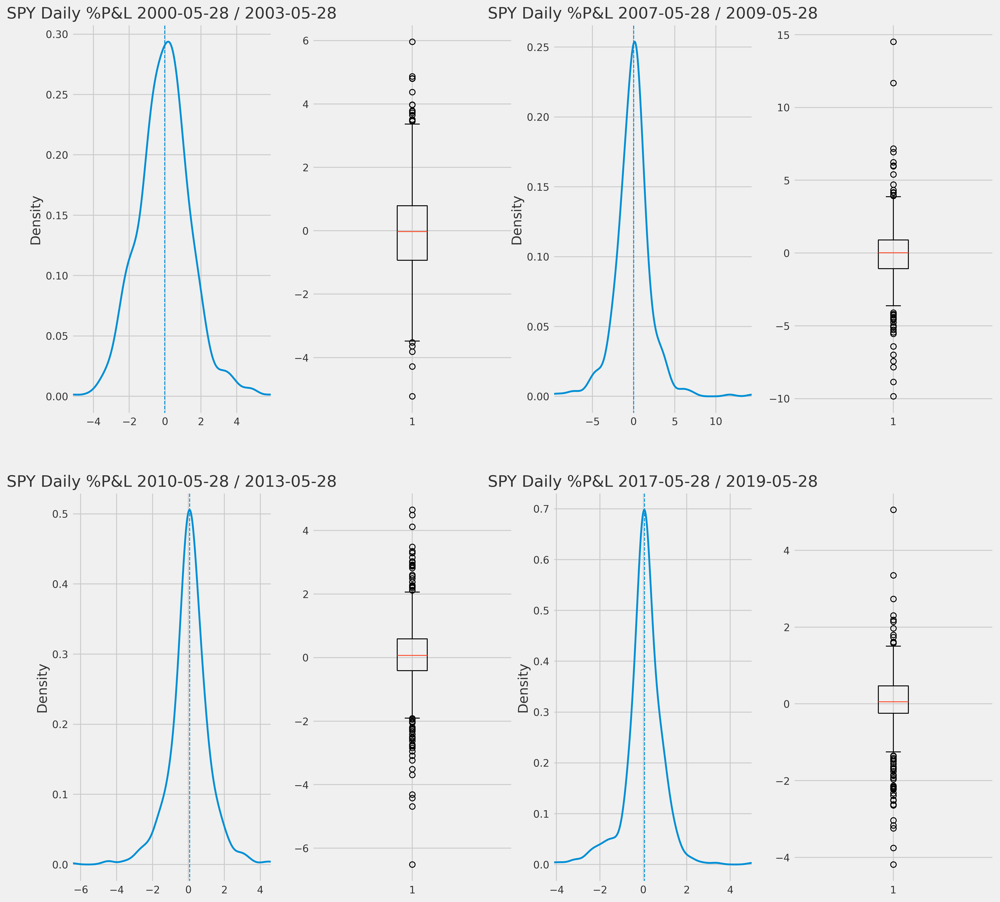

In [1524]:
plt.figure(figsize=(16,16))

for i in range(4):
    plt.subplot(2,4,(2*i)+1)
    pd.Series(spy[i]).plot(kind='density', lw=2)
    plt.axvline(np.median(spy[i]), linewidth=1, label='median return', ls='--')
    plt.xlim(min(spy[i]), max(spy[i]))
    plt.title('SPY Daily %P&L '+starts[i]+' / '+ends[i])
    plt.subplot(2,4,(2*i)+2)
    plt.boxplot(pd.Series(spy[i]))

plt.show()

In [1532]:
%%time 

mus = [] 
sigmas = []

observations = []

r_f = 0 #still cash as a risk-free option
k = 0 #still free commission
Js = [3, 5, 10, 20, 60, 120] 

for i in range(4):
    mus.append(np.median(spy[i])) #let's try with median this time
    sigmas.append(robust.mad(spy[i])) #let's try with median absolute deviation this time
    
    #same numbers as before
    gammas = [mus[i]+0.5*sigmas[i], mus[i]+0.8*sigmas[i], 
              mus[i]+sigmas[i], mus[i]+1.2*sigmas[i], mus[i]+1.5*sigmas[i]] 
    delta = mus[i]

    for J in Js:
        for gamma in gammas:
            s = simple_stop_loss(spy[i], gamma, delta, J) #compute the policies
            r_s = return_of_portfolio_with_stop_loss(spy[i], r_f, s, k) #compute the adjusted returns 
            #compute metrics for the strategy
            Delta_mu, p_0, ratio = stopping_premium_and_ratio(r_s, spy[i]) 
            Delta_sigma = variance_difference(r_s, spy[i])
            #collect the data
            observations.append([i, gamma, delta, J, Delta_mu, p_0, ratio, Delta_sigma])
        
obs = pd.DataFrame(observations, columns=['market', 'gamma', 'delta', 'J', 'Delta_mu', 'p_0', 'ratio', 'Delta_sigma'])
obs

CPU times: user 574 ms, sys: 4.39 ms, total: 579 ms
Wall time: 575 ms


,market,gamma,delta,J,Delta_mu,p_0,ratio,Delta_sigma
0,0,0.616335,-0.025290,3,-0.025246,0.332000,-0.076041,-0.872873
1,0,1.001309,-0.025290,3,-0.019205,0.281333,-0.068264,-0.764135
2,0,1.257959,-0.025290,3,-0.013295,0.249333,-0.053321,-0.700565
3,0,1.514609,-0.025290,3,-0.033888,0.221333,-0.153110,-0.667847
4,0,1.899584,-0.025290,3,-0.034584,0.165333,-0.209177,-0.539330
...,...,...,...,...,...,...,...,...
115,3,0.311577,0.053143,120,-0.017860,0.141717,-0.126023,-0.238298
116,3,0.466638,0.053143,120,-0.025168,0.133733,-0.188199,-0.216786
117,3,0.570012,0.053143,120,-0.024136,0.129741,-0.186032,-0.215041
118,3,0.673385,0.053143,120,-0.023591,0.127745,-0.184674,-0.214803


Now let's visualize how they would have performed through the lens of our metrics.

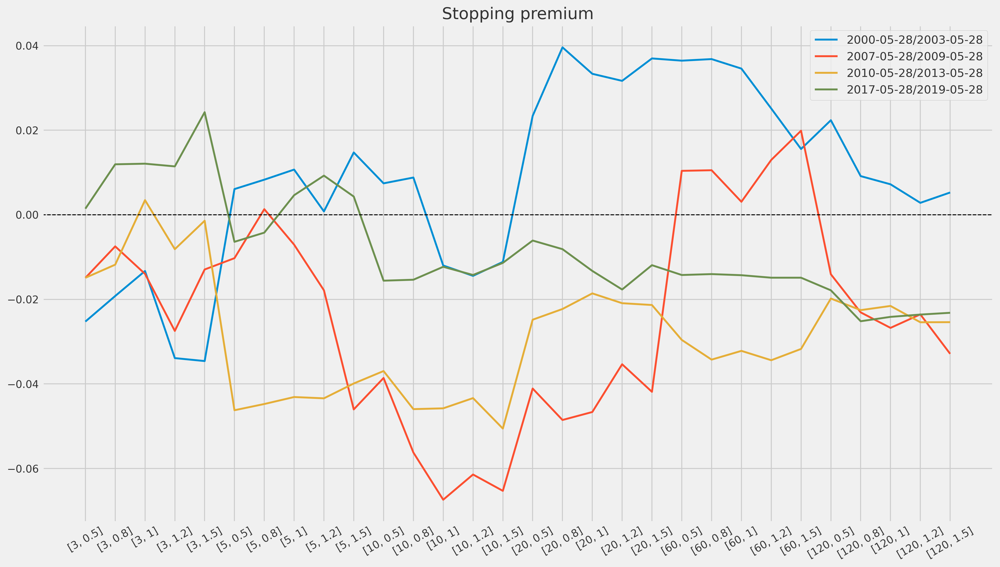

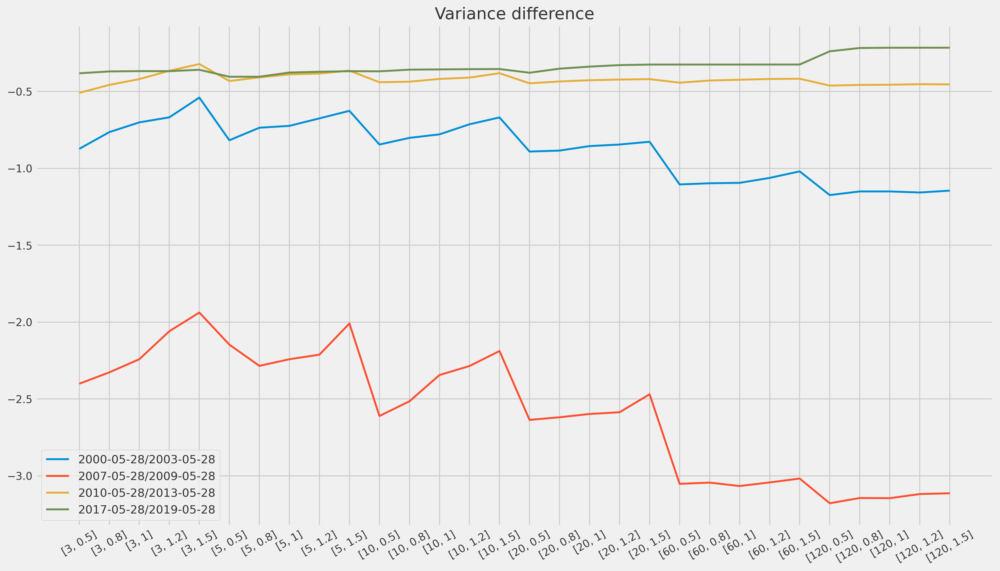

In [1551]:
plt.figure(figsize=(16,9))
for i in range(4):
    plt.plot(range(len(lbls)), obs.loc[obs.market==i].Delta_mu, lw=2, label=starts[i]+'/'+ends[i])
plt.axhline(0, lw=1, ls='--', c='black')
plt.xticks(ticks=range(len(lbls)), labels=lbls, rotation=30)
plt.title('Stopping premium')
plt.legend()
plt.show()

plt.figure(figsize=(16,9))
for i in range(4):
    plt.plot(range(len(lbls)), obs.loc[obs.market==i].Delta_sigma, lw=2, label=starts[i]+'/'+ends[i])
plt.xticks(ticks=range(len(lbls)), labels=lbls, rotation=30)
plt.title('Variance difference')
plt.legend()
plt.show()

This time we witness positive stopping premiums along with overall reductions of variance (which should be a good thing maybe).

\textbf{Conclusion}

We took into exam the most liquid market in the world, the US market represented by the index SPY.

We started with a global overview, over thirty years long, and then zoomed in into four different particular markets. In the former scenario we got no positive stopping premium while on the latter we have had quite a few combinations (37) with positive $\Delta_\mu$ which is great! 

Probably not too surprisingly for somebody the most positive premiums out of all our strategies would have been collected in the presence of a bear market (blue and red lines) where stop-loss intuitevely would help. 

This leads to the conclusion that, even if over thirty years things tends to evens out and stopping premiums were never positive (supposing I haven't made any mistake in the process actually), if you manage to get the timing correct you can get a nice bump on your strategy applying even a simple stop-loss policy. In theory avoiding drawdowns looks like a pretty solid strategy already, unfortunately though one would have had to predict the market condition in advance to optimally use the simple stop-loss policy (at least on SPY), otherwise she would have probably been better off by simply holding (assuming she wouldn't have minded the variance along the way). That being said, not sure if it would be even possible anticipating a market condition, maybe with some quantitative indicator, but looks like worth the try because it would mean finding a money making indicator, let alone the use of a stop-loss policy.

Don't know about you but my crystal ball is always broken! Hopefully I could still help in some quest though :)